In [ ]:
# # https://blog.roboflow.com/yolo-nas-how-to-train-on-custom-dataset/
# %pip install super-gradients==3.1.1
# %pip install roboflow
# %pip install supervision
# # kernel needs restart

In [1]:
import imutils

using notebooks from 

https://colab.research.google.com/drive/1q0RmeVRzLwRXW-h9dPFSOchwJkThUy6d

and 

https://blog.roboflow.com/yolo-nas-how-to-train-on-custom-dataset/

In [2]:
# Load YOLO NAS model
import torch
from super_gradients.training import models

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
MODEL_ARCH = 'yolo_nas_m'
#            'yolo_nas_l'
#            'yolo_nas_m'
#            'yolo_nas_s'

model = models.get(MODEL_ARCH, pretrained_weights="coco").to(DEVICE)


[2023-10-12 16:42:56] INFO - crash_tips_setup.py - Crash tips is enabled. You can set your environment variable to CRASH_HANDLER=FALSE to disable it


The console stream is logged into C:\Users\Yvonne\sg_logs\console.log


[2023-10-12 16:42:56] WARNING - __init__.py - Failed to import pytorch_quantization
[2023-10-12 16:42:56,896] torch.distributed.elastic.multiprocessing.redirects: [WARNING] NOTE: Redirects are currently not supported in Windows or MacOs.
[2023-10-12 16:42:59] WARNING - calibrator.py - Failed to import pytorch_quantization
[2023-10-12 16:42:59] WARNING - export.py - Failed to import pytorch_quantization
[2023-10-12 16:42:59] WARNING - selective_quantization_utils.py - Failed to import pytorch_quantization
[2023-10-12 16:42:59] WARNING - env_sanity_check.py - Failed to verify operating system: Deci officially supports only Linux kernels. Some features may not work as expected.
[2023-10-12 16:42:59] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with

# Baseline - 

**YOLO-NAS without any fine-tuning**

spoiler alert - like YOLOv5 and YOLOv8, it cannot detect hello panda boxes or snack packs. does not even classify them as snacks or something generic.

In [3]:
imagepath = 'data/valid/images/'
imagefile = 'IMG_2830_jpg.rf.9f92a5f9adaf5620ea1b490bdaaa848c.jpg'
image = imagepath + imagefile

# IMG_2830_jpg.rf.9f92a5f9adaf5620ea1b490bdaaa848c.jpg
# IMG_2832_jpg.rf.c1d2ea9b172f82b3087c8c68cba4bc43.jpg
# IMG_2840_JPG.rf.1b2133396f7a654dfab851fed7f2f1d7.jpg
# IMG_2842_JPG.rf.9aa4aec4703e3b029ebca0e3dd01104f.jpg

[2023-10-12 16:49:50] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


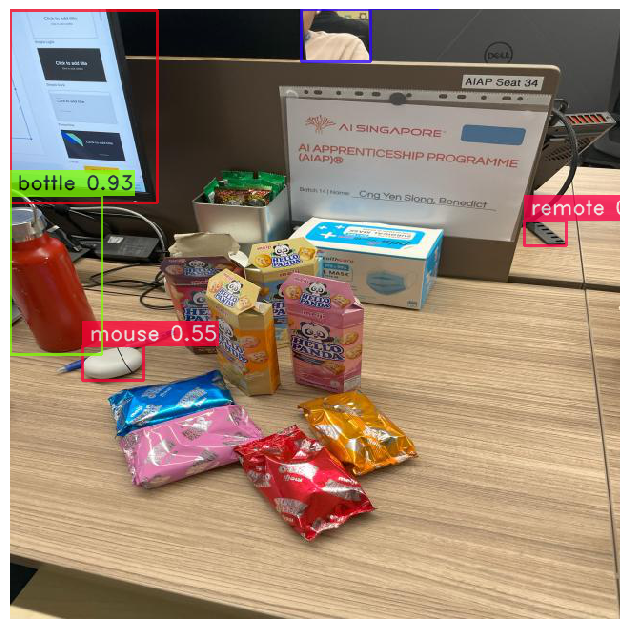

[2023-10-12 16:49:51] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


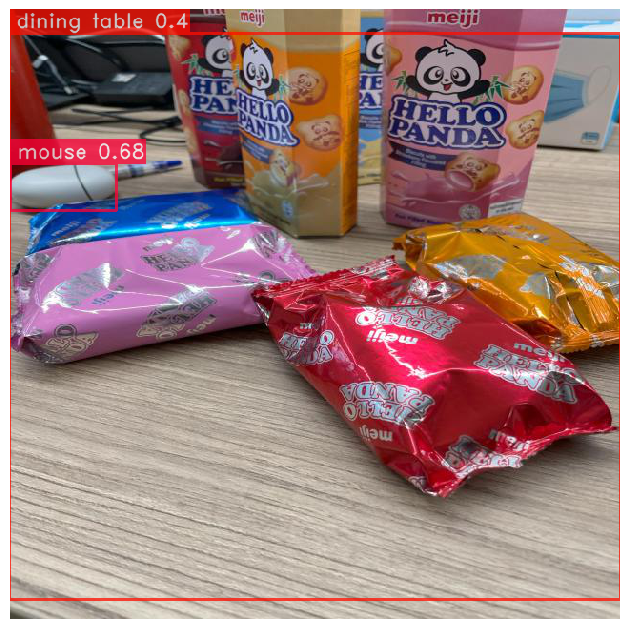

[2023-10-12 16:49:51] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


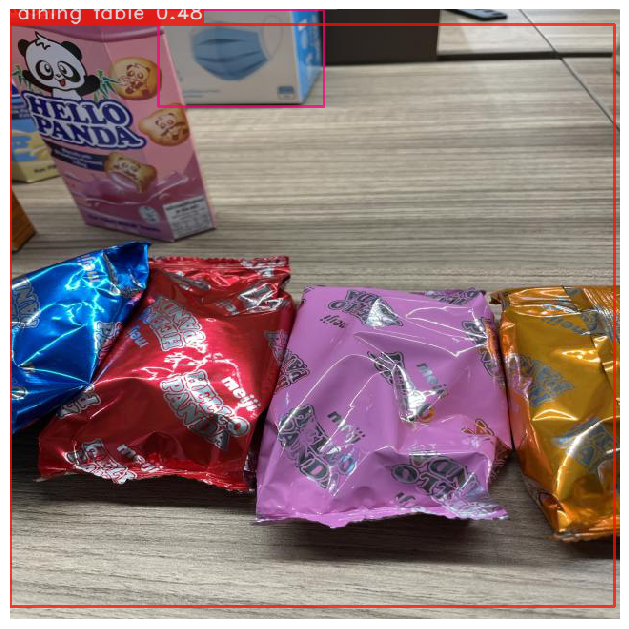

[2023-10-12 16:49:52] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


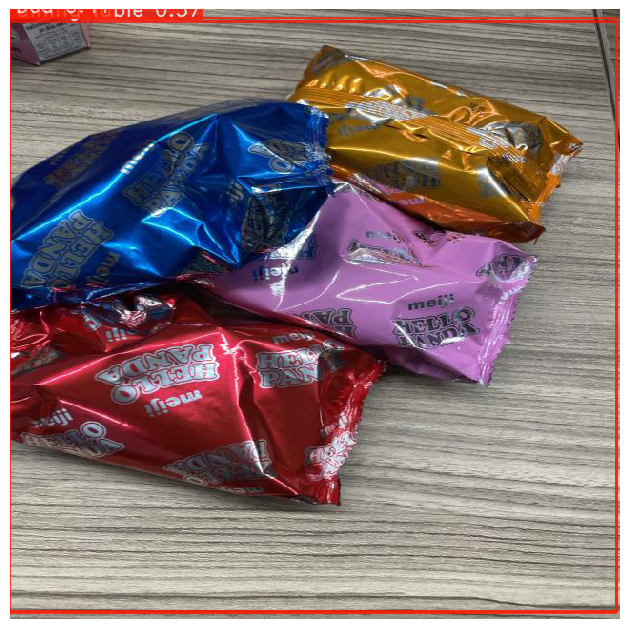

In [9]:
CONFIDENCE_TRESHOLD = 0.35

imagefile = 'IMG_2830_jpg.rf.9f92a5f9adaf5620ea1b490bdaaa848c.jpg'
image = imagepath + imagefile
model.predict(image, conf=CONFIDENCE_TRESHOLD).show()

imagefile = 'IMG_2832_jpg.rf.c1d2ea9b172f82b3087c8c68cba4bc43.jpg'
image = imagepath + imagefile
model.predict(image, conf=CONFIDENCE_TRESHOLD).show()

imagefile = 'IMG_2840_JPG.rf.1b2133396f7a654dfab851fed7f2f1d7.jpg'
image = imagepath + imagefile
model.predict(image, conf=CONFIDENCE_TRESHOLD).show()

imagefile = 'IMG_2842_JPG.rf.9aa4aec4703e3b029ebca0e3dd01104f.jpg'
image = imagepath + imagefile
model.predict(image, conf=CONFIDENCE_TRESHOLD).show()

#result = list(model.predict(image, conf=CONFIDENCE_TRESHOLD))[0]

# Training!

https://colab.research.google.com/drive/1q0RmeVRzLwRXW-h9dPFSOchwJkThUy6d

In [37]:
from super_gradients.training import Trainer

CHECKPOINT_DIR = 'checkpoints'
trainer = Trainer(experiment_name='my_first_yolonas_run', ckpt_root_dir=CHECKPOINT_DIR)



In [38]:
from super_gradients.training import dataloaders
from super_gradients.training.dataloaders.dataloaders import coco_detection_yolo_format_train, coco_detection_yolo_format_val

In [39]:
dataset_params = {
    'data_dir':'data/',
    'train_images_dir':'train/images',
    'train_labels_dir':'train/labels',
    'val_images_dir':'valid/images',
    'val_labels_dir':'valid/labels',
    'test_images_dir':'test/images',
    'test_labels_dir':'test/labels',
    'classes': ['hellopanda', 'hellopandabox']
}

In [40]:
#from IPython.display import clear_output

train_data = coco_detection_yolo_format_train(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['train_images_dir'],
        'labels_dir': dataset_params['train_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size':16,
        'num_workers':2
    }
)

val_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['val_images_dir'],
        'labels_dir': dataset_params['val_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size':16,
        'num_workers':2
    }
)

test_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['test_images_dir'],
        'labels_dir': dataset_params['test_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size':16,
        'num_workers':2
    }
)

#clear_output()

# note: my labels used polygons - i think that is causing some problems. need to export to version with only bounding boxes



[2023-10-12 17:53:45] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.
Indexing dataset annotations: 100%|██████████| 129/129 [00:00<00:00, 258.56it/s]
[2023-10-12 17:53:45] WARNING - detection_dataset.py - Found 106 invalid bbox that were ignored. For more information, please set `show_all_warnings=True`.
[2023-10-12 17:53:46] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.
Indexing dataset annotations: 100%|██████████| 29/29 [00:00<00:00, 174.76it/s]
[2023-10-12 17:53:46] WARNING - detection_dataset.py - Found 4 invalid bbox that were ignored. For more information, please set `show_all_warnings=True`.
[2023-10-12 17:53:46] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.

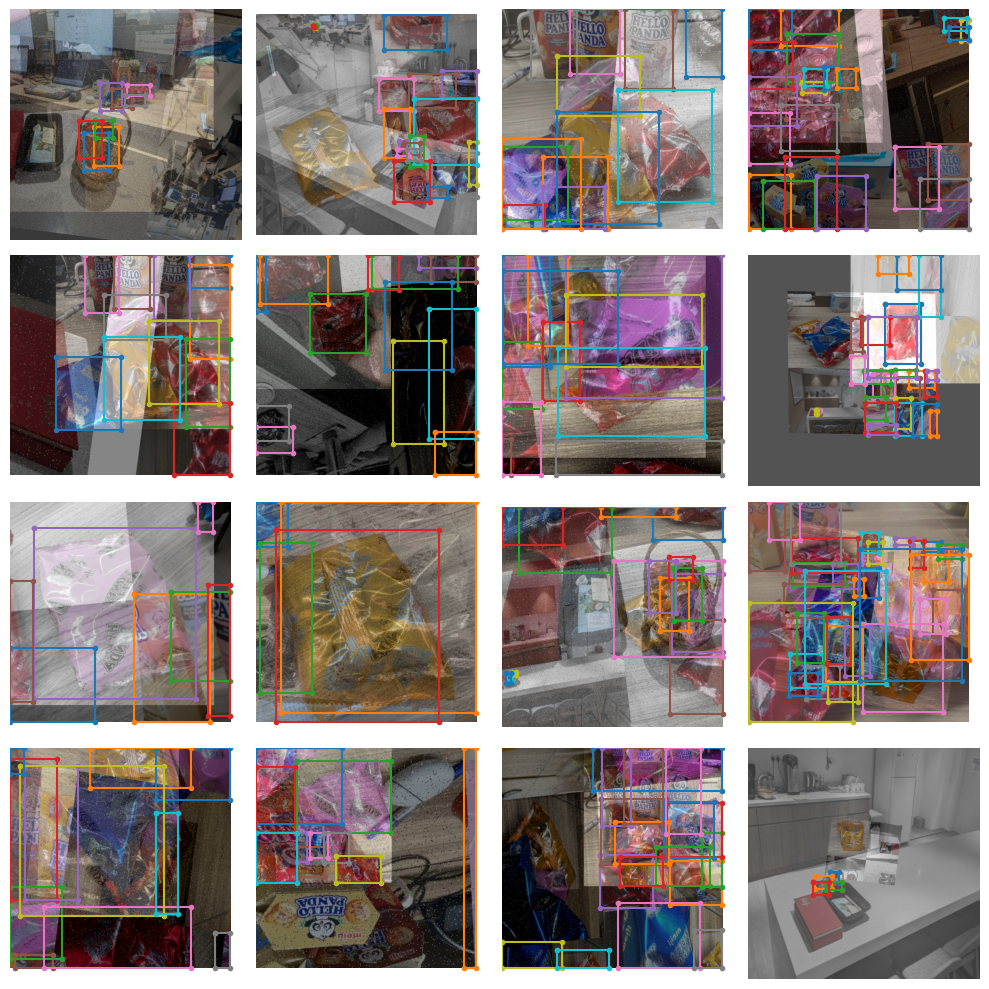

In [41]:
# train_data.dataset.transforms # already augmented
train_data.dataset.plot()

In [42]:
# Instantiating the model
from super_gradients.training import models
model = models.get('yolo_nas_m',
                   num_classes=len(dataset_params['classes']),
                   pretrained_weights="coco"
                   )

[2023-10-12 17:53:52] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.
[2023-10-12 17:53:52] INFO - checkpoint_utils.py - Successfully loaded pretrained weights for architecture yolo_nas_m


In [43]:
from super_gradients.training.losses import PPYoloELoss
from super_gradients.training.metrics import DetectionMetrics_050
from super_gradients.training.models.detection_models.pp_yolo_e import PPYoloEPostPredictionCallback


In [44]:
# Training Parameters
train_params = {
    'silent_mode': False ,
    "average_best_models":True,
    "warmup_mode": "linear_epoch_step",
    "warmup_initial_lr": 1e-6,
    "lr_warmup_epochs": 3,
    "initial_lr": 5e-4,
    "lr_mode": "cosine",
    "cosine_final_lr_ratio": 0.1,
    "optimizer": "Adam",
    "optimizer_params": {"weight_decay": 0.0001},
    "zero_weight_decay_on_bias_and_bn": True,
    "ema": True,
    "ema_params": {"decay": 0.9, "decay_type": "threshold"},
    # ONLY TRAINING FOR 10 EPOCHS FOR THIS EXAMPLE NOTEBOOK
    "max_epochs": 10,
    "mixed_precision": False, #not available for CPU 
    "loss": PPYoloELoss(
        use_static_assigner=False,
        # NOTE: num_classes needs to be defined here
        num_classes=len(dataset_params['classes']),
        reg_max=16
    ),
    "valid_metrics_list": [
        DetectionMetrics_050(
            score_thres=0.1,
            top_k_predictions=300,
            # NOTE: num_classes needs to be defined here
            num_cls=len(dataset_params['classes']),
            normalize_targets=True,
            post_prediction_callback=PPYoloEPostPredictionCallback(
                score_threshold=0.01,
                nms_top_k=1000,
                max_predictions=300,
                nms_threshold=0.7
            )
        )
    ],
    "metric_to_watch": 'mAP@0.50'
}

In [45]:
# Training the model

trainer.train(model=model,
              training_params=train_params,
              train_loader=train_data,
              valid_loader=val_data)

The console stream is now moved to checkpoints\my_first_yolonas_run/console_Oct12_17_53_57.txt


[2023-10-12 17:53:59] INFO - sg_trainer.py - Using EMA with params {'decay': 0.9, 'decay_type': 'threshold'}
[2023-10-12 17:54:15] INFO - sg_trainer_utils.py - TRAINING PARAMETERS:
    - Mode:                         Single GPU
    - Number of GPUs:               0          (0 available on the machine)
    - Dataset size:                 126        (len(train_set))
    - Batch size per GPU:           16         (batch_size)
    - Batch Accumulate:             1          (batch_accumulate)
    - Total batch size:             16         (num_gpus * batch_size)
    - Effective Batch size:         16         (num_gpus * batch_size * batch_accumulate)
    - Iterations per epoch:         7          (len(train_loader))
    - Gradient updates per epoch:   7          (len(train_loader) / batch_accumulate)

[2023-10-12 17:54:15] INFO - sg_trainer.py - Started training for 10 epochs (0/9)

Validating: 100%|██████████| 2/2 [00:37<00:00, 18.65s/it]
[2023-10-12 18:00:23] INFO - base_sg_logger.py - C

SUMMARY OF EPOCH 0
├── Train
│   ├── Ppyoloeloss/loss_cls = 2.5856
│   ├── Ppyoloeloss/loss_iou = 0.2712
│   ├── Ppyoloeloss/loss_dfl = 1.5605
│   └── Ppyoloeloss/loss = 4.0439
└── Validation
    ├── Ppyoloeloss/loss_cls = 2.454
    ├── Ppyoloeloss/loss_iou = 0.2042
    ├── Ppyoloeloss/loss_dfl = 1.3377
    ├── Ppyoloeloss/loss = 3.6334
    ├── Precision@0.50 = 0.0006
    ├── Recall@0.50 = 0.0081
    ├── Map@0.50 = 0.0644
    └── F1@0.50 = 0.001



Validating epoch 1: 100%|██████████| 2/2 [00:34<00:00, 17.48s/it]


SUMMARY OF EPOCH 1
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.8149
│   │   ├── Epoch N-1      = 2.5856 (↘ -0.7707)
│   │   └── Best until now = 2.5856 (↘ -0.7707)
│   ├── Ppyoloeloss/loss_iou = 0.2746
│   │   ├── Epoch N-1      = 0.2712 (↗ 0.0033)
│   │   └── Best until now = 0.2712 (↗ 0.0033)
│   ├── Ppyoloeloss/loss_dfl = 1.6344
│   │   ├── Epoch N-1      = 1.5605 (↗ 0.0739)
│   │   └── Best until now = 1.5605 (↗ 0.0739)
│   └── Ppyoloeloss/loss = 3.3185
│       ├── Epoch N-1      = 4.0439 (↘ -0.7254)
│       └── Best until now = 4.0439 (↘ -0.7254)
└── Validation
    ├── Ppyoloeloss/loss_cls = 73.7196
    │   ├── Epoch N-1      = 2.454  (↗ 71.2656)
    │   └── Best until now = 2.454  (↗ 71.2656)
    ├── Ppyoloeloss/loss_iou = 0.2247
    │   ├── Epoch N-1      = 0.2042 (↗ 0.0205)
    │   └── Best until now = 0.2042 (↗ 0.0205)
    ├── Ppyoloeloss/loss_dfl = 1.4446
    │   ├── Epoch N-1      = 1.3377 (↗ 0.1069)
    │   └── Best until now = 1.3377 (↗ 0.1069)
    ├── Ppyoloeloss/loss = 75

Validating epoch 2: 100%|██████████| 2/2 [00:34<00:00, 17.14s/it]


SUMMARY OF EPOCH 2
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.3654
│   │   ├── Epoch N-1      = 1.8149 (↘ -0.4494)
│   │   └── Best until now = 1.8149 (↘ -0.4494)
│   ├── Ppyoloeloss/loss_iou = 0.2784
│   │   ├── Epoch N-1      = 0.2746 (↗ 0.0039)
│   │   └── Best until now = 0.2712 (↗ 0.0072)
│   ├── Ppyoloeloss/loss_dfl = 1.6208
│   │   ├── Epoch N-1      = 1.6344 (↘ -0.0136)
│   │   └── Best until now = 1.5605 (↗ 0.0603)
│   └── Ppyoloeloss/loss = 2.8719
│       ├── Epoch N-1      = 3.3185 (↘ -0.4466)
│       └── Best until now = 3.3185 (↘ -0.4466)
└── Validation
    ├── Ppyoloeloss/loss_cls = 6.0197
    │   ├── Epoch N-1      = 73.7196 (↘ -67.6999)
    │   └── Best until now = 2.454  (↗ 3.5657)
    ├── Ppyoloeloss/loss_iou = 0.5218
    │   ├── Epoch N-1      = 0.2247 (↗ 0.2971)
    │   └── Best until now = 0.2042 (↗ 0.3176)
    ├── Ppyoloeloss/loss_dfl = 2.8876
    │   ├── Epoch N-1      = 1.4446 (↗ 1.443)
    │   └── Best until now = 1.3377 (↗ 1.5499)
    ├── Ppyoloeloss/loss = 8.

Validating epoch 3: 100%|██████████| 2/2 [00:33<00:00, 16.93s/it]


SUMMARY OF EPOCH 3
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.2143
│   │   ├── Epoch N-1      = 1.3654 (↘ -0.1511)
│   │   └── Best until now = 1.3654 (↘ -0.1511)
│   ├── Ppyoloeloss/loss_iou = 0.2681
│   │   ├── Epoch N-1      = 0.2784 (↘ -0.0103)
│   │   └── Best until now = 0.2712 (↘ -0.0032)
│   ├── Ppyoloeloss/loss_dfl = 1.5271
│   │   ├── Epoch N-1      = 1.6208 (↘ -0.0937)
│   │   └── Best until now = 1.5605 (↘ -0.0334)
│   └── Ppyoloeloss/loss = 2.648
│       ├── Epoch N-1      = 2.8719 (↘ -0.2238)
│       └── Best until now = 2.8719 (↘ -0.2238)
└── Validation
    ├── Ppyoloeloss/loss_cls = 2.3564
    │   ├── Epoch N-1      = 6.0197 (↘ -3.6632)
    │   └── Best until now = 2.454  (↘ -0.0975)
    ├── Ppyoloeloss/loss_iou = 0.6984
    │   ├── Epoch N-1      = 0.5218 (↗ 0.1765)
    │   └── Best until now = 0.2042 (↗ 0.4941)
    ├── Ppyoloeloss/loss_dfl = 3.7597
    │   ├── Epoch N-1      = 2.8876 (↗ 0.8721)
    │   └── Best until now = 1.3377 (↗ 2.422)
    ├── Ppyoloeloss/loss = 5

Validating epoch 4: 100%|██████████| 2/2 [00:32<00:00, 16.36s/it]


SUMMARY OF EPOCH 4
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.1609
│   │   ├── Epoch N-1      = 1.2143 (↘ -0.0534)
│   │   └── Best until now = 1.2143 (↘ -0.0534)
│   ├── Ppyoloeloss/loss_iou = 0.2669
│   │   ├── Epoch N-1      = 0.2681 (↘ -0.0012)
│   │   └── Best until now = 0.2681 (↘ -0.0012)
│   ├── Ppyoloeloss/loss_dfl = 1.5201
│   │   ├── Epoch N-1      = 1.5271 (↘ -0.007)
│   │   └── Best until now = 1.5271 (↘ -0.007)
│   └── Ppyoloeloss/loss = 2.5883
│       ├── Epoch N-1      = 2.648  (↘ -0.0598)
│       └── Best until now = 2.648  (↘ -0.0598)
└── Validation
    ├── Ppyoloeloss/loss_cls = 5.9511
    │   ├── Epoch N-1      = 2.3564 (↗ 3.5946)
    │   └── Best until now = 2.3564 (↗ 3.5946)
    ├── Ppyoloeloss/loss_iou = 0.613
    │   ├── Epoch N-1      = 0.6984 (↘ -0.0854)
    │   └── Best until now = 0.2042 (↗ 0.4087)
    ├── Ppyoloeloss/loss_dfl = 3.5551
    │   ├── Epoch N-1      = 3.7597 (↘ -0.2047)
    │   └── Best until now = 1.3377 (↗ 2.2173)
    ├── Ppyoloeloss/loss = 9.

Validating epoch 5: 100%|██████████| 2/2 [00:32<00:00, 16.23s/it]


SUMMARY OF EPOCH 5
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.1418
│   │   ├── Epoch N-1      = 1.1609 (↘ -0.0191)
│   │   └── Best until now = 1.1609 (↘ -0.0191)
│   ├── Ppyoloeloss/loss_iou = 0.2615
│   │   ├── Epoch N-1      = 0.2669 (↘ -0.0054)
│   │   └── Best until now = 0.2669 (↘ -0.0054)
│   ├── Ppyoloeloss/loss_dfl = 1.4995
│   │   ├── Epoch N-1      = 1.5201 (↘ -0.0206)
│   │   └── Best until now = 1.5201 (↘ -0.0206)
│   └── Ppyoloeloss/loss = 2.5452
│       ├── Epoch N-1      = 2.5883 (↘ -0.0431)
│       └── Best until now = 2.5883 (↘ -0.0431)
└── Validation
    ├── Ppyoloeloss/loss_cls = 168.877
    │   ├── Epoch N-1      = 5.9511 (↗ 162.9259)
    │   └── Best until now = 2.3564 (↗ 166.5205)
    ├── Ppyoloeloss/loss_iou = 0.3869
    │   ├── Epoch N-1      = 0.613  (↘ -0.2261)
    │   └── Best until now = 0.2042 (↗ 0.1827)
    ├── Ppyoloeloss/loss_dfl = 2.6152
    │   ├── Epoch N-1      = 3.5551 (↘ -0.9399)
    │   └── Best until now = 1.3377 (↗ 1.2774)
    ├── Ppyoloeloss/l

Validating epoch 6: 100%|██████████| 2/2 [00:35<00:00, 17.54s/it]
[2023-10-12 18:38:46] INFO - base_sg_logger.py - Checkpoint saved in checkpoints\my_first_yolonas_run\ckpt_best.pth
[2023-10-12 18:38:46] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.20367498695850372


SUMMARY OF EPOCH 6
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.1226
│   │   ├── Epoch N-1      = 1.1418 (↘ -0.0192)
│   │   └── Best until now = 1.1418 (↘ -0.0192)
│   ├── Ppyoloeloss/loss_iou = 0.2448
│   │   ├── Epoch N-1      = 0.2615 (↘ -0.0166)
│   │   └── Best until now = 0.2615 (↘ -0.0166)
│   ├── Ppyoloeloss/loss_dfl = 1.4368
│   │   ├── Epoch N-1      = 1.4995 (↘ -0.0627)
│   │   └── Best until now = 1.4995 (↘ -0.0627)
│   └── Ppyoloeloss/loss = 2.4531
│       ├── Epoch N-1      = 2.5452 (↘ -0.0921)
│       └── Best until now = 2.5452 (↘ -0.0921)
└── Validation
    ├── Ppyoloeloss/loss_cls = 62.61
    │   ├── Epoch N-1      = 168.877 (↘ -106.267)
    │   └── Best until now = 2.3564 (↗ 60.2535)
    ├── Ppyoloeloss/loss_iou = 0.3244
    │   ├── Epoch N-1      = 0.3869 (↘ -0.0625)
    │   └── Best until now = 0.2042 (↗ 0.1201)
    ├── Ppyoloeloss/loss_dfl = 2.2032
    │   ├── Epoch N-1      = 2.6152 (↘ -0.412)
    │   └── Best until now = 1.3377 (↗ 0.8655)
    ├── Ppyoloeloss/loss

Validating epoch 7: 100%|██████████| 2/2 [00:34<00:00, 17.31s/it]
[2023-10-12 18:45:58] INFO - base_sg_logger.py - Checkpoint saved in checkpoints\my_first_yolonas_run\ckpt_best.pth
[2023-10-12 18:45:58] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.20938611030578613


SUMMARY OF EPOCH 7
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.1379
│   │   ├── Epoch N-1      = 1.1226 (↗ 0.0153)
│   │   └── Best until now = 1.1226 (↗ 0.0153)
│   ├── Ppyoloeloss/loss_iou = 0.2493
│   │   ├── Epoch N-1      = 0.2448 (↗ 0.0044)
│   │   └── Best until now = 0.2448 (↗ 0.0044)
│   ├── Ppyoloeloss/loss_dfl = 1.4506
│   │   ├── Epoch N-1      = 1.4368 (↗ 0.0138)
│   │   └── Best until now = 1.4368 (↗ 0.0138)
│   └── Ppyoloeloss/loss = 2.4864
│       ├── Epoch N-1      = 2.4531 (↗ 0.0333)
│       └── Best until now = 2.4531 (↗ 0.0333)
└── Validation
    ├── Ppyoloeloss/loss_cls = 28.7434
    │   ├── Epoch N-1      = 62.61  (↘ -33.8666)
    │   └── Best until now = 2.3564 (↗ 26.3869)
    ├── Ppyoloeloss/loss_iou = 0.2714
    │   ├── Epoch N-1      = 0.3244 (↘ -0.053)
    │   └── Best until now = 0.2042 (↗ 0.0671)
    ├── Ppyoloeloss/loss_dfl = 1.7945
    │   ├── Epoch N-1      = 2.2032 (↘ -0.4086)
    │   └── Best until now = 1.3377 (↗ 0.4568)
    ├── Ppyoloeloss/loss = 30.3

Validating epoch 8: 100%|██████████| 2/2 [00:33<00:00, 16.78s/it]
[2023-10-12 18:52:54] INFO - base_sg_logger.py - Checkpoint saved in checkpoints\my_first_yolonas_run\ckpt_best.pth
[2023-10-12 18:52:54] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.2578175365924835


SUMMARY OF EPOCH 8
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.112
│   │   ├── Epoch N-1      = 1.1379 (↘ -0.0258)
│   │   └── Best until now = 1.1226 (↘ -0.0106)
│   ├── Ppyoloeloss/loss_iou = 0.2391
│   │   ├── Epoch N-1      = 0.2493 (↘ -0.0101)
│   │   └── Best until now = 0.2448 (↘ -0.0057)
│   ├── Ppyoloeloss/loss_dfl = 1.4288
│   │   ├── Epoch N-1      = 1.4506 (↘ -0.0219)
│   │   └── Best until now = 1.4368 (↘ -0.008)
│   └── Ppyoloeloss/loss = 2.4242
│       ├── Epoch N-1      = 2.4864 (↘ -0.0621)
│       └── Best until now = 2.4531 (↘ -0.0289)
└── Validation
    ├── Ppyoloeloss/loss_cls = 15.7985
    │   ├── Epoch N-1      = 28.7434 (↘ -12.9448)
    │   └── Best until now = 2.3564 (↗ 13.4421)
    ├── Ppyoloeloss/loss_iou = 0.2493
    │   ├── Epoch N-1      = 0.2714 (↘ -0.022)
    │   └── Best until now = 0.2042 (↗ 0.0451)
    ├── Ppyoloeloss/loss_dfl = 1.6366
    │   ├── Epoch N-1      = 1.7945 (↘ -0.158)
    │   └── Best until now = 1.3377 (↗ 0.2988)
    ├── Ppyoloeloss/loss 

Validating epoch 9: 100%|██████████| 2/2 [00:37<00:00, 18.68s/it]
[2023-10-12 19:00:00] INFO - base_sg_logger.py - Checkpoint saved in checkpoints\my_first_yolonas_run\ckpt_best.pth
[2023-10-12 19:00:00] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.31352534890174866


SUMMARY OF EPOCH 9
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0913
│   │   ├── Epoch N-1      = 1.112  (↘ -0.0208)
│   │   └── Best until now = 1.112  (↘ -0.0208)
│   ├── Ppyoloeloss/loss_iou = 0.2312
│   │   ├── Epoch N-1      = 0.2391 (↘ -0.0079)
│   │   └── Best until now = 0.2391 (↘ -0.0079)
│   ├── Ppyoloeloss/loss_dfl = 1.3785
│   │   ├── Epoch N-1      = 1.4288 (↘ -0.0502)
│   │   └── Best until now = 1.4288 (↘ -0.0502)
│   └── Ppyoloeloss/loss = 2.3586
│       ├── Epoch N-1      = 2.4242 (↘ -0.0656)
│       └── Best until now = 2.4242 (↘ -0.0656)
└── Validation
    ├── Ppyoloeloss/loss_cls = 9.3383
    │   ├── Epoch N-1      = 15.7985 (↘ -6.4603)
    │   └── Best until now = 2.3564 (↗ 6.9818)
    ├── Ppyoloeloss/loss_iou = 0.2222
    │   ├── Epoch N-1      = 0.2493 (↘ -0.0271)
    │   └── Best until now = 0.2042 (↗ 0.018)
    ├── Ppyoloeloss/loss_dfl = 1.4473
    │   ├── Epoch N-1      = 1.6366 (↘ -0.1892)
    │   └── Best until now = 1.3377 (↗ 0.1096)
    ├── Ppyoloeloss/loss 

[2023-10-12 19:00:06] INFO - sg_trainer.py - RUNNING ADDITIONAL TEST ON THE AVERAGED MODEL...
Validating epoch 10: 100%|██████████| 2/2 [00:36<00:00, 18.05s/it]


[2023-10-12 19:00:43] INFO - base_sg_logger.py - [CLEANUP] - Successfully stopped system monitoring process


In [46]:
# Get best trained model

# had used checkpoint averaging
# If you want to use the best weights, or weights from the last epoch you'd use one of the following in the code below:
# best weights: checkpoint_path = checkpoints/my_first_yolonas_run/ckpt_best.pth
# last weights: checkpoint_path = checkpoints/my_first_yolonas_run/ckpt_latest.pth

best_model = models.get('yolo_nas_m',
                        num_classes=len(dataset_params['classes']),
                        checkpoint_path="checkpoints/my_first_yolonas_run/average_model.pth")


[2023-10-12 19:02:16] INFO - checkpoint_utils.py - Successfully loaded model weights from checkpoints/my_first_yolonas_run/average_model.pth EMA checkpoint.


In [53]:
# Evaluating best trained model

trainer.test(model=best_model,
            test_loader=test_data,
            test_metrics_list=DetectionMetrics_050(score_thres=0.1,
                                                   top_k_predictions=300,
                                                   num_cls=len(dataset_params['classes']),
                                                   normalize_targets=True,
                                                   post_prediction_callback=PPYoloEPostPredictionCallback(score_threshold=0.01, nms_top_k=1000, max_predictions=300, nms_threshold=0.7 ),
                                                   )
)

Testing: 100%|██████████| 1/1 [00:08<00:00,  8.54s/it]

{'PPYoloELoss/loss_cls': 6.358188,
 'PPYoloELoss/loss_iou': 0.1853535,
 'PPYoloELoss/loss_dfl': 1.3278174,
 'PPYoloELoss/loss': 7.48548,
 'Precision@0.50': 0.016566265374422073,
 'Recall@0.50': 0.7857142686843872,
 'mAP@0.50': 0.4188741147518158,
 'F1@0.50': 0.03244837746024132}

Testing: 100%|██████████| 1/1 [00:09<00:00,  9.13s/it]


[2023-10-12 19:18:21] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


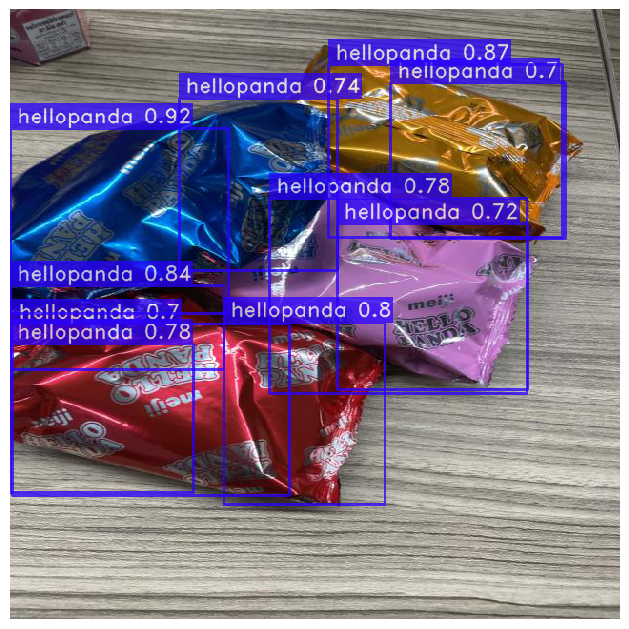

In [58]:
CONFIDENCE_TRESHOLD = 0.7
best_model.predict(image, conf=CONFIDENCE_TRESHOLD).show()

# Training with 80 classes and coco128 dataset in addition to mine

* pls change classes , class names
* in label annotated text -> change class from 0 to 80 cos coco dataset is 0-79

## Model2 fine tuning - Step 1

In [76]:
# Model2 fine tuning - Step 1 Data loader - train, val, test and Admin

# Admin - save locations
CHECKPOINT_DIR = 'checkpoints'
trainer2 = Trainer(experiment_name='yolonas_finetune_81classes_1', ckpt_root_dir=CHECKPOINT_DIR)

# Dataset loading - need to change this for coco128  addition. ensure label number is 80
dataset_params2 = {
    'data_dir':'data/hp_and_coco128/',
    'train_images_dir':'train/images',
    'train_labels_dir':'train/labels',
    'val_images_dir':'valid/images',
    'val_labels_dir':'valid/labels',
    'test_images_dir':'test/images',
    'test_labels_dir':'test/labels',
    'classes': ['person','bicycle','car','motorcycle','airplane','bus','train','truck','boat','traffic light','fire hydrant','stop sign','parking meter','bench','bird','cat','dog','horse','sheep','cow','elephant','bear','zebra','giraffe','backpack','umbrella','handbag','tie','suitcase','frisbee','skis','snowboard','sports ball','kite','baseball bat','baseball glove','skateboard','surfboard','tennis racket','bottle','wine glass','cup','fork','knife','spoon','bowl','banana','apple','sandwich','orange','broccoli','carrot','hot dog','pizza','donut','cake','chair','couch','potted plant','bed','dining table','toilet','tv','laptop','mouse','remote','keyboard','cell phone','microwave','oven','toaster','sink','refrigerator','book','clock','vase','scissors','teddy bear','hair drier','toothbrush', 'hello panda'],
}
    #'classes': ['aeroplane', 'backpack', 'banana', 'baseball bat', 'baseball glove', 'bear', 'bed', 
    # 'bench', 'bicycle', 'bird', 'boat', 'book', 'bottle', 'bowl', 'broccoli', 'bus', 'cake', 'car', 
    # 'carrot', 'cat', 'cell phone', 'chair', 'clock', 'cup', 'diningtable', 'dog', 'donut', 'elephant', 
    # 'fork', 'frisbee', 'giraffe', 'handbag', 'horse', 'hot dog', 'kite', 'knife', 'laptop', 'microwave', 
    # 'motorbike', 'mouse', 'orange', 'oven', 'person', 'pizza', 'pottedplant', 'refrigerator', 'remote', 
    # 'sandwich', 'scissors', 'sink', 'skateboard', 'skis', 'snowboard', 'sofa', 'spoon', 'sports ball', 
    # 'stop sign', 'suitcase', 'teddy bear', 'tennis racket', 'tie', 'toilet', 'toothbrush', 'traffic light', 
    # 'train', 'truck', 'tvmonitor', 'umbrella', 'vase', 'wine glass', 'zebra', 'hello panda']


train_data2 = coco_detection_yolo_format_train(
    dataset_params={
        'data_dir': dataset_params2['data_dir'],
        'images_dir': dataset_params2['train_images_dir'],
        'labels_dir': dataset_params2['train_labels_dir'],
        'classes': dataset_params2['classes']
    },
    dataloader_params={
        'batch_size':16,
        'num_workers':2
    }
)

val_data2 = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': dataset_params2['data_dir'],
        'images_dir': dataset_params2['val_images_dir'],
        'labels_dir': dataset_params2['val_labels_dir'],
        'classes': dataset_params2['classes']
    },
    dataloader_params={
        'batch_size':16,
        'num_workers':2
    }
)

test_data2 = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': dataset_params2['data_dir'],
        'images_dir': dataset_params2['test_images_dir'],
        'labels_dir': dataset_params2['test_labels_dir'],
        'classes': dataset_params2['classes']
    },
    dataloader_params={
        'batch_size':16,
        'num_workers':2
    }
)



[2023-10-13 15:02:19] WARNING - yolo_format_detection.py - 2 images are note associated to any label file
[2023-10-13 15:02:19] WARNING - yolo_format_detection.py - 2 label files are not associated to any image.
[2023-10-13 15:02:19] WARNING - yolo_format_detection.py - As a consequence, 231/233 images and 231/233 label files will be used.
[2023-10-13 15:02:19] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.
Indexing dataset annotations: 100%|██████████| 231/231 [00:00<00:00, 281.82it/s]
[2023-10-13 15:02:19] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.
Indexing dataset annotations: 100%|██████████| 28/28 [00:00<00:00, 5199.47it/s]


[2023-10-13 15:02:20] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.
Indexing dataset annotations: 100%|██████████| 6/6 [00:00<00:00, 5852.52it/s]


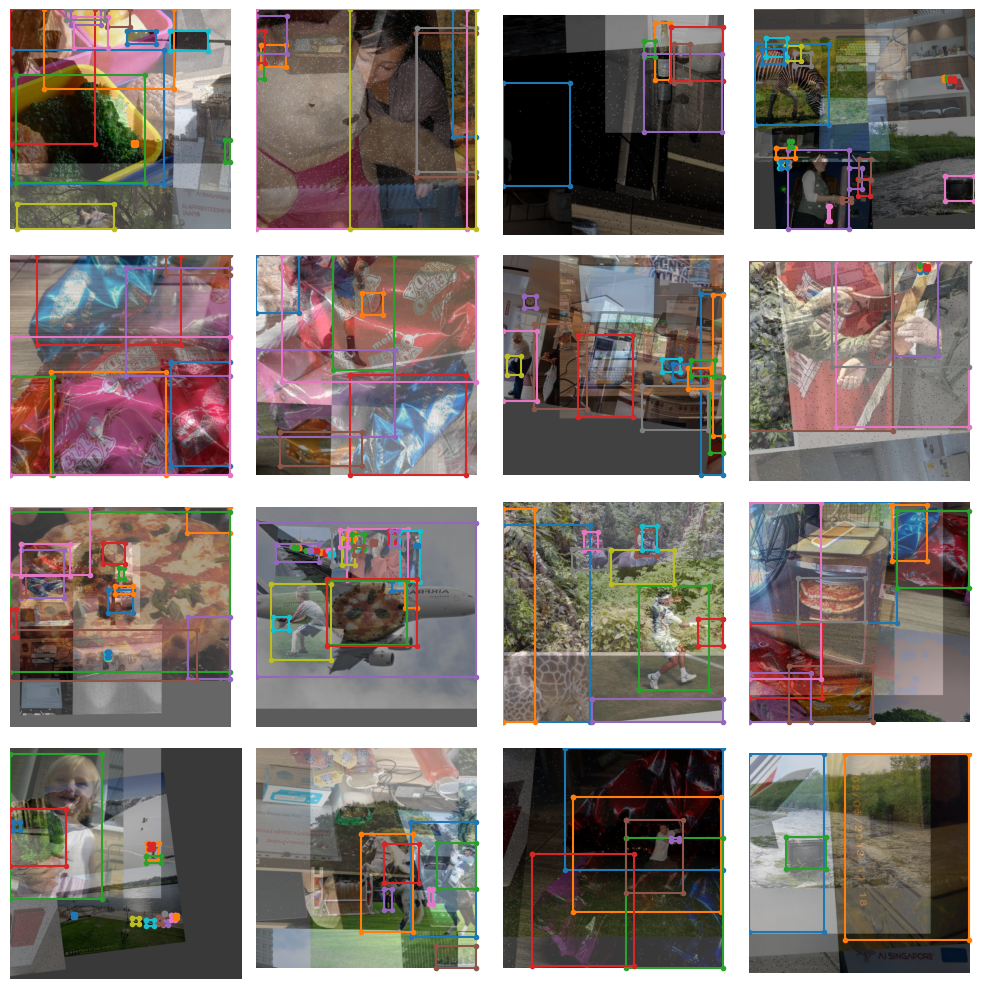

In [77]:
# train_data.dataset.transforms # already augmented
train_data2.dataset.plot()

## Model2 fine tuning - Step 2 training and testing

In [78]:
# Model2 fine tuning - Step 2 training and testing

# Instantiating the model
from super_gradients.training import models
model2 = models.get('yolo_nas_m',
                   num_classes=len(dataset_params2['classes']),
                   pretrained_weights="coco"
                   )


# Training Parameters
train_params2 = {
    'silent_mode': False ,
    "average_best_models":True,
    "warmup_mode": "linear_epoch_step",
    "warmup_initial_lr": 1e-6,
    "lr_warmup_epochs": 3,
    "initial_lr": 5e-4,
    "lr_mode": "cosine",
    "cosine_final_lr_ratio": 0.1,
    "optimizer": "Adam",
    "optimizer_params": {"weight_decay": 0.0001},
    "zero_weight_decay_on_bias_and_bn": True,
    "ema": True,
    "ema_params": {"decay": 0.9, "decay_type": "threshold"},
    # ONLY TRAINING FOR 10 EPOCHS FOR THIS EXAMPLE NOTEBOOK
    "max_epochs": 10,
    "mixed_precision": False, #not available for CPU 
    "loss": PPYoloELoss(
        use_static_assigner=False,
        # NOTE: num_classes needs to be defined here
        num_classes=len(dataset_params2['classes']),
        reg_max=16
    ),
    "valid_metrics_list": [
        DetectionMetrics_050(
            score_thres=0.1,
            top_k_predictions=300,
            # NOTE: num_classes needs to be defined here
            num_cls=len(dataset_params2['classes']),
            normalize_targets=True,
            post_prediction_callback=PPYoloEPostPredictionCallback(
                score_threshold=0.01,
                nms_top_k=1000,
                max_predictions=300,
                nms_threshold=0.7
            )
        )
    ],
    "metric_to_watch": 'mAP@0.50'
}


# Training the model
trainer2.train(model=model2,
              training_params=train_params2,
              train_loader=train_data2,
              valid_loader=val_data2)

[2023-10-13 15:02:32] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.
[2023-10-13 15:02:32] INFO - checkpoint_utils.py - Successfully loaded pretrained weights for architecture yolo_nas_m


The console stream is now moved to checkpoints\yolonas_finetune_81classes_1/console_Oct13_15_02_32.txt


[2023-10-13 15:02:34] INFO - sg_trainer.py - Using EMA with params {'decay': 0.9, 'decay_type': 'threshold'}
[2023-10-13 15:02:50] INFO - sg_trainer_utils.py - TRAINING PARAMETERS:
    - Mode:                         Single GPU
    - Number of GPUs:               0          (0 available on the machine)
    - Dataset size:                 231        (len(train_set))
    - Batch size per GPU:           16         (batch_size)
    - Batch Accumulate:             1          (batch_accumulate)
    - Total batch size:             16         (num_gpus * batch_size)
    - Effective Batch size:         16         (num_gpus * batch_size * batch_accumulate)
    - Iterations per epoch:         14         (len(train_loader))
    - Gradient updates per epoch:   14         (len(train_loader) / batch_accumulate)

[2023-10-13 15:02:50] INFO - sg_trainer.py - Started training for 10 epochs (0/9)

Validating: 100%|██████████| 2/2 [00:38<00:00, 19.44s/it]
[2023-10-13 15:16:56] INFO - base_sg_logger.py - C

SUMMARY OF EPOCH 0
├── Train
│   ├── Ppyoloeloss/loss_cls = 2.3903
│   ├── Ppyoloeloss/loss_iou = 0.2534
│   ├── Ppyoloeloss/loss_dfl = 1.3914
│   └── Ppyoloeloss/loss = 3.7196
└── Validation
    ├── Ppyoloeloss/loss_cls = 2.8211
    ├── Ppyoloeloss/loss_iou = 0.1839
    ├── Ppyoloeloss/loss_dfl = 1.2595
    ├── Ppyoloeloss/loss = 3.9107
    ├── Precision@0.50 = 0.0
    ├── Recall@0.50 = 0.0
    ├── Map@0.50 = 0.0
    └── F1@0.50 = 0.0



Validating epoch 1: 100%|██████████| 2/2 [00:38<00:00, 19.04s/it]
[2023-10-13 15:31:29] INFO - base_sg_logger.py - Checkpoint saved in checkpoints\yolonas_finetune_81classes_1\ckpt_best.pth
[2023-10-13 15:31:29] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.10473392903804779


SUMMARY OF EPOCH 1
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.9702
│   │   ├── Epoch N-1      = 2.3903 (↘ -0.4201)
│   │   └── Best until now = 2.3903 (↘ -0.4201)
│   ├── Ppyoloeloss/loss_iou = 0.2511
│   │   ├── Epoch N-1      = 0.2534 (↘ -0.0024)
│   │   └── Best until now = 0.2534 (↘ -0.0024)
│   ├── Ppyoloeloss/loss_dfl = 1.3572
│   │   ├── Epoch N-1      = 1.3914 (↘ -0.0342)
│   │   └── Best until now = 1.3914 (↘ -0.0342)
│   └── Ppyoloeloss/loss = 3.2765
│       ├── Epoch N-1      = 3.7196 (↘ -0.4431)
│       └── Best until now = 3.7196 (↘ -0.4431)
└── Validation
    ├── Ppyoloeloss/loss_cls = 43.1051
    │   ├── Epoch N-1      = 2.8211 (↗ 40.284)
    │   └── Best until now = 2.8211 (↗ 40.284)
    ├── Ppyoloeloss/loss_iou = 0.2478
    │   ├── Epoch N-1      = 0.1839 (↗ 0.0639)
    │   └── Best until now = 0.1839 (↗ 0.0639)
    ├── Ppyoloeloss/loss_dfl = 1.3648
    │   ├── Epoch N-1      = 1.2595 (↗ 0.1053)
    │   └── Best until now = 1.2595 (↗ 0.1053)
    ├── Ppyoloeloss/loss = 

Validating epoch 2: 100%|██████████| 2/2 [00:42<00:00, 21.30s/it]
[2023-10-13 15:46:52] INFO - base_sg_logger.py - Checkpoint saved in checkpoints\yolonas_finetune_81classes_1\ckpt_best.pth
[2023-10-13 15:46:52] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.11197429150342941


SUMMARY OF EPOCH 2
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.5892
│   │   ├── Epoch N-1      = 1.9702 (↘ -0.381)
│   │   └── Best until now = 1.9702 (↘ -0.381)
│   ├── Ppyoloeloss/loss_iou = 0.269
│   │   ├── Epoch N-1      = 0.2511 (↗ 0.018)
│   │   └── Best until now = 0.2511 (↗ 0.018)
│   ├── Ppyoloeloss/loss_dfl = 1.4098
│   │   ├── Epoch N-1      = 1.3572 (↗ 0.0526)
│   │   └── Best until now = 1.3572 (↗ 0.0526)
│   └── Ppyoloeloss/loss = 2.9667
│       ├── Epoch N-1      = 3.2765 (↘ -0.3098)
│       └── Best until now = 3.2765 (↘ -0.3098)
└── Validation
    ├── Ppyoloeloss/loss_cls = 29.2597
    │   ├── Epoch N-1      = 43.1051 (↘ -13.8454)
    │   └── Best until now = 2.8211 (↗ 26.4386)
    ├── Ppyoloeloss/loss_iou = 0.2697
    │   ├── Epoch N-1      = 0.2478 (↗ 0.0218)
    │   └── Best until now = 0.1839 (↗ 0.0858)
    ├── Ppyoloeloss/loss_dfl = 1.8864
    │   ├── Epoch N-1      = 1.3648 (↗ 0.5216)
    │   └── Best until now = 1.2595 (↗ 0.6269)
    ├── Ppyoloeloss/loss = 30.87

Validating epoch 3: 100%|██████████| 2/2 [00:34<00:00, 17.27s/it]


SUMMARY OF EPOCH 3
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.5705
│   │   ├── Epoch N-1      = 1.5892 (↘ -0.0187)
│   │   └── Best until now = 1.5892 (↘ -0.0187)
│   ├── Ppyoloeloss/loss_iou = 0.2801
│   │   ├── Epoch N-1      = 0.269  (↗ 0.0111)
│   │   └── Best until now = 0.2511 (↗ 0.0291)
│   ├── Ppyoloeloss/loss_dfl = 1.5289
│   │   ├── Epoch N-1      = 1.4098 (↗ 0.1191)
│   │   └── Best until now = 1.3572 (↗ 0.1717)
│   └── Ppyoloeloss/loss = 3.0352
│       ├── Epoch N-1      = 2.9667 (↗ 0.0686)
│       └── Best until now = 2.9667 (↗ 0.0686)
└── Validation
    ├── Ppyoloeloss/loss_cls = 6.5636
    │   ├── Epoch N-1      = 29.2597 (↘ -22.6961)
    │   └── Best until now = 2.8211 (↗ 3.7425)
    ├── Ppyoloeloss/loss_iou = 0.4635
    │   ├── Epoch N-1      = 0.2697 (↗ 0.1939)
    │   └── Best until now = 0.1839 (↗ 0.2796)
    ├── Ppyoloeloss/loss_dfl = 6.6489
    │   ├── Epoch N-1      = 1.8864 (↗ 4.7625)
    │   └── Best until now = 1.2595 (↗ 5.3894)
    ├── Ppyoloeloss/loss = 11.0

Validating epoch 4: 100%|██████████| 2/2 [00:46<00:00, 23.23s/it]


SUMMARY OF EPOCH 4
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.5209
│   │   ├── Epoch N-1      = 1.5705 (↘ -0.0496)
│   │   └── Best until now = 1.5705 (↘ -0.0496)
│   ├── Ppyoloeloss/loss_iou = 0.2854
│   │   ├── Epoch N-1      = 0.2801 (↗ 0.0052)
│   │   └── Best until now = 0.2511 (↗ 0.0343)
│   ├── Ppyoloeloss/loss_dfl = 1.5467
│   │   ├── Epoch N-1      = 1.5289 (↗ 0.0178)
│   │   └── Best until now = 1.3572 (↗ 0.1895)
│   └── Ppyoloeloss/loss = 3.0077
│       ├── Epoch N-1      = 3.0352 (↘ -0.0275)
│       └── Best until now = 2.9667 (↗ 0.041)
└── Validation
    ├── Ppyoloeloss/loss_cls = 53.2071
    │   ├── Epoch N-1      = 6.5636 (↗ 46.6435)
    │   └── Best until now = 2.8211 (↗ 50.386)
    ├── Ppyoloeloss/loss_iou = 0.3438
    │   ├── Epoch N-1      = 0.4635 (↘ -0.1198)
    │   └── Best until now = 0.1839 (↗ 0.1599)
    ├── Ppyoloeloss/loss_dfl = 2.5859
    │   ├── Epoch N-1      = 6.6489 (↘ -4.063)
    │   └── Best until now = 1.2595 (↗ 1.3264)
    ├── Ppyoloeloss/loss = 55.3

Validating epoch 5: 100%|██████████| 2/2 [00:41<00:00, 20.70s/it]
[2023-10-13 16:32:56] INFO - base_sg_logger.py - Checkpoint saved in checkpoints\yolonas_finetune_81classes_1\ckpt_best.pth
[2023-10-13 16:32:56] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.22229912877082825


SUMMARY OF EPOCH 5
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.5099
│   │   ├── Epoch N-1      = 1.5209 (↘ -0.011)
│   │   └── Best until now = 1.5209 (↘ -0.011)
│   ├── Ppyoloeloss/loss_iou = 0.2766
│   │   ├── Epoch N-1      = 0.2854 (↘ -0.0088)
│   │   └── Best until now = 0.2511 (↗ 0.0255)
│   ├── Ppyoloeloss/loss_dfl = 1.5138
│   │   ├── Epoch N-1      = 1.5467 (↘ -0.0329)
│   │   └── Best until now = 1.3572 (↗ 0.1566)
│   └── Ppyoloeloss/loss = 2.9583
│       ├── Epoch N-1      = 3.0077 (↘ -0.0494)
│       └── Best until now = 2.9667 (↘ -0.0084)
└── Validation
    ├── Ppyoloeloss/loss_cls = 4.2269
    │   ├── Epoch N-1      = 53.2071 (↘ -48.9803)
    │   └── Best until now = 2.8211 (↗ 1.4057)
    ├── Ppyoloeloss/loss_iou = 0.2562
    │   ├── Epoch N-1      = 0.3438 (↘ -0.0876)
    │   └── Best until now = 0.1839 (↗ 0.0723)
    ├── Ppyoloeloss/loss_dfl = 1.7763
    │   ├── Epoch N-1      = 2.5859 (↘ -0.8096)
    │   └── Best until now = 1.2595 (↗ 0.5168)
    ├── Ppyoloeloss/loss = 

Validating epoch 6: 100%|██████████| 2/2 [00:37<00:00, 18.96s/it]
[2023-10-13 16:47:29] INFO - base_sg_logger.py - Checkpoint saved in checkpoints\yolonas_finetune_81classes_1\ckpt_best.pth
[2023-10-13 16:47:29] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.3189358115196228


SUMMARY OF EPOCH 6
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.501
│   │   ├── Epoch N-1      = 1.5099 (↘ -0.0088)
│   │   └── Best until now = 1.5099 (↘ -0.0088)
│   ├── Ppyoloeloss/loss_iou = 0.2565
│   │   ├── Epoch N-1      = 0.2766 (↘ -0.0201)
│   │   └── Best until now = 0.2511 (↗ 0.0054)
│   ├── Ppyoloeloss/loss_dfl = 1.4548
│   │   ├── Epoch N-1      = 1.5138 (↘ -0.059)
│   │   └── Best until now = 1.3572 (↗ 0.0975)
│   └── Ppyoloeloss/loss = 2.8697
│       ├── Epoch N-1      = 2.9583 (↘ -0.0886)
│       └── Best until now = 2.9583 (↘ -0.0886)
└── Validation
    ├── Ppyoloeloss/loss_cls = 2.8956
    │   ├── Epoch N-1      = 4.2269 (↘ -1.3313)
    │   └── Best until now = 2.8211 (↗ 0.0745)
    ├── Ppyoloeloss/loss_iou = 0.2318
    │   ├── Epoch N-1      = 0.2562 (↘ -0.0244)
    │   └── Best until now = 0.1839 (↗ 0.0479)
    ├── Ppyoloeloss/loss_dfl = 1.5659
    │   ├── Epoch N-1      = 1.7763 (↘ -0.2104)
    │   └── Best until now = 1.2595 (↗ 0.3064)
    ├── Ppyoloeloss/loss = 4.

Validating epoch 7: 100%|██████████| 2/2 [00:37<00:00, 18.99s/it]
[2023-10-13 17:02:25] INFO - base_sg_logger.py - Checkpoint saved in checkpoints\yolonas_finetune_81classes_1\ckpt_best.pth
[2023-10-13 17:02:25] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.4794684946537018


SUMMARY OF EPOCH 7
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.4468
│   │   ├── Epoch N-1      = 1.501  (↘ -0.0542)
│   │   └── Best until now = 1.501  (↘ -0.0542)
│   ├── Ppyoloeloss/loss_iou = 0.2533
│   │   ├── Epoch N-1      = 0.2565 (↘ -0.0032)
│   │   └── Best until now = 0.2511 (↗ 0.0022)
│   ├── Ppyoloeloss/loss_dfl = 1.4182
│   │   ├── Epoch N-1      = 1.4548 (↘ -0.0365)
│   │   └── Best until now = 1.3572 (↗ 0.061)
│   └── Ppyoloeloss/loss = 2.7892
│       ├── Epoch N-1      = 2.8697 (↘ -0.0804)
│       └── Best until now = 2.8697 (↘ -0.0804)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.9564
    │   ├── Epoch N-1      = 2.8956 (↘ -0.9392)
    │   └── Best until now = 2.8211 (↘ -0.8647)
    ├── Ppyoloeloss/loss_iou = 0.2023
    │   ├── Epoch N-1      = 0.2318 (↘ -0.0295)
    │   └── Best until now = 0.1839 (↗ 0.0184)
    ├── Ppyoloeloss/loss_dfl = 1.3288
    │   ├── Epoch N-1      = 1.5659 (↘ -0.2371)
    │   └── Best until now = 1.2595 (↗ 0.0693)
    ├── Ppyoloeloss/loss = 

Validating epoch 8: 100%|██████████| 2/2 [00:37<00:00, 18.94s/it]
[2023-10-13 17:17:31] INFO - base_sg_logger.py - Checkpoint saved in checkpoints\yolonas_finetune_81classes_1\ckpt_best.pth
[2023-10-13 17:17:31] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.4902709126472473


SUMMARY OF EPOCH 8
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.4117
│   │   ├── Epoch N-1      = 1.4468 (↘ -0.0351)
│   │   └── Best until now = 1.4468 (↘ -0.0351)
│   ├── Ppyoloeloss/loss_iou = 0.2447
│   │   ├── Epoch N-1      = 0.2533 (↘ -0.0086)
│   │   └── Best until now = 0.2511 (↘ -0.0063)
│   ├── Ppyoloeloss/loss_dfl = 1.39
│   │   ├── Epoch N-1      = 1.4182 (↘ -0.0282)
│   │   └── Best until now = 1.3572 (↗ 0.0327)
│   └── Ppyoloeloss/loss = 2.7185
│       ├── Epoch N-1      = 2.7892 (↘ -0.0707)
│       └── Best until now = 2.7892 (↘ -0.0707)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.5835
    │   ├── Epoch N-1      = 1.9564 (↘ -0.373)
    │   └── Best until now = 1.9564 (↘ -0.373)
    ├── Ppyoloeloss/loss_iou = 0.1923
    │   ├── Epoch N-1      = 0.2023 (↘ -0.01)
    │   └── Best until now = 0.1839 (↗ 0.0084)
    ├── Ppyoloeloss/loss_dfl = 1.2446
    │   ├── Epoch N-1      = 1.3288 (↘ -0.0842)
    │   └── Best until now = 1.2595 (↘ -0.0149)
    ├── Ppyoloeloss/loss = 2.6

Validating epoch 9: 100%|██████████| 2/2 [00:38<00:00, 19.19s/it]
[2023-10-13 17:32:36] INFO - base_sg_logger.py - Checkpoint saved in checkpoints\yolonas_finetune_81classes_1\ckpt_best.pth
[2023-10-13 17:32:36] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.5432674288749695


SUMMARY OF EPOCH 9
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.4259
│   │   ├── Epoch N-1      = 1.4117 (↗ 0.0142)
│   │   └── Best until now = 1.4117 (↗ 0.0142)
│   ├── Ppyoloeloss/loss_iou = 0.2415
│   │   ├── Epoch N-1      = 0.2447 (↘ -0.0032)
│   │   └── Best until now = 0.2447 (↘ -0.0032)
│   ├── Ppyoloeloss/loss_dfl = 1.3487
│   │   ├── Epoch N-1      = 1.39   (↘ -0.0412)
│   │   └── Best until now = 1.3572 (↘ -0.0085)
│   └── Ppyoloeloss/loss = 2.704
│       ├── Epoch N-1      = 2.7185 (↘ -0.0146)
│       └── Best until now = 2.7185 (↘ -0.0146)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.4425
    │   ├── Epoch N-1      = 1.5835 (↘ -0.141)
    │   └── Best until now = 1.5835 (↘ -0.141)
    ├── Ppyoloeloss/loss_iou = 0.1921
    │   ├── Epoch N-1      = 0.1923 (↘ -0.0002)
    │   └── Best until now = 0.1839 (↗ 0.0082)
    ├── Ppyoloeloss/loss_dfl = 1.2467
    │   ├── Epoch N-1      = 1.2446 (↗ 0.0021)
    │   └── Best until now = 1.2446 (↗ 0.0021)
    ├── Ppyoloeloss/loss = 2.5

[2023-10-13 17:32:46] INFO - sg_trainer.py - RUNNING ADDITIONAL TEST ON THE AVERAGED MODEL...
Validating epoch 10: 100%|██████████| 2/2 [00:32<00:00, 16.03s/it]


### Model2 fine tuning - Step 3 Evaluating best trained model

In [79]:
# Model2 fine tuning - Step 3 Evaluating best trained model

# If you want to use the best weights, or weights from the last epoch you'd use one of the following in the code below:
# best weights: checkpoint_path = checkpoints/my_first_yolonas_run/ckpt_best.pth
# last weights: checkpoint_path = checkpoints/my_first_yolonas_run/ckpt_latest.pth

best_model2 = models.get('yolo_nas_m',
                        num_classes=len(dataset_params2['classes']),
                        checkpoint_path="checkpoints/yolonas_finetune_81classes_1/ckpt_latest.pth")


trainer2.test(model=best_model,
            test_loader=test_data2,
            test_metrics_list=DetectionMetrics_050(score_thres=0.1,
                                                   top_k_predictions=300,
                                                   num_cls=len(dataset_params2['classes']),
                                                   normalize_targets=True,
                                                   post_prediction_callback=PPYoloEPostPredictionCallback(score_threshold=0.01, nms_top_k=1000, max_predictions=300, nms_threshold=0.7 ),
                                                   )
)



[2023-10-13 17:33:19] INFO - base_sg_logger.py - [CLEANUP] - Successfully stopped system monitoring process
[2023-10-13 17:33:21] INFO - checkpoint_utils.py - Successfully loaded model weights from checkpoints/yolonas_finetune_81classes_1/ckpt_latest.pth EMA checkpoint.
Testing: 100%|██████████| 1/1 [00:12<00:00, 12.01s/it]

{'PPYoloELoss/loss_cls': 1.2518761,
 'PPYoloELoss/loss_iou': 0.15979937,
 'PPYoloELoss/loss_dfl': 1.1768068,
 'PPYoloELoss/loss': 2.239778,
 'Precision@0.50': 0.029921259731054306,
 'Recall@0.50': 0.8636363744735718,
 'mAP@0.50': 0.8083937168121338,
 'F1@0.50': 0.05783866345882416}

Testing: 100%|██████████| 1/1 [00:12<00:00, 12.65s/it]


c:\Users\Yvonne\anaconda3\envs\hellopanda\lib\site-packages\torch\amp\autocast_mode.py:250: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn(
[2023-10-13 17:41:59] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


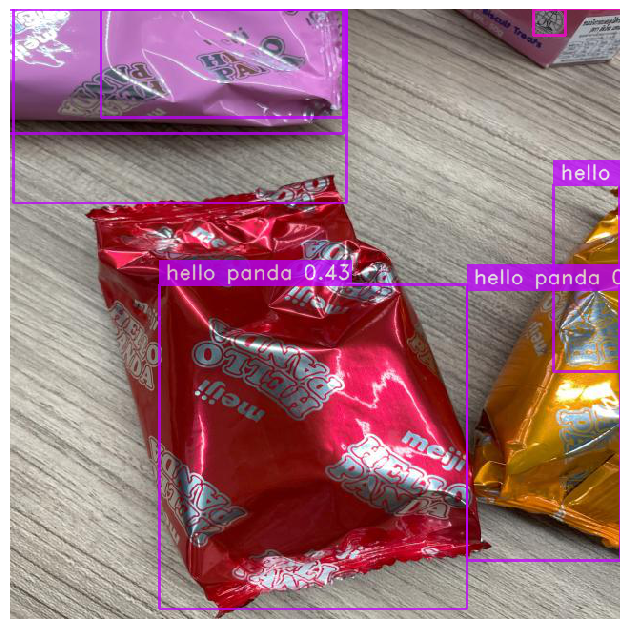

[2023-10-13 17:42:00] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


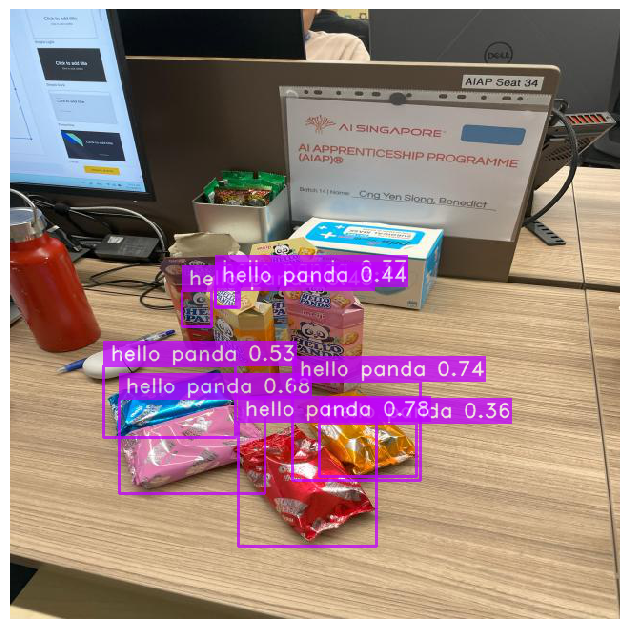

[2023-10-13 17:42:01] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


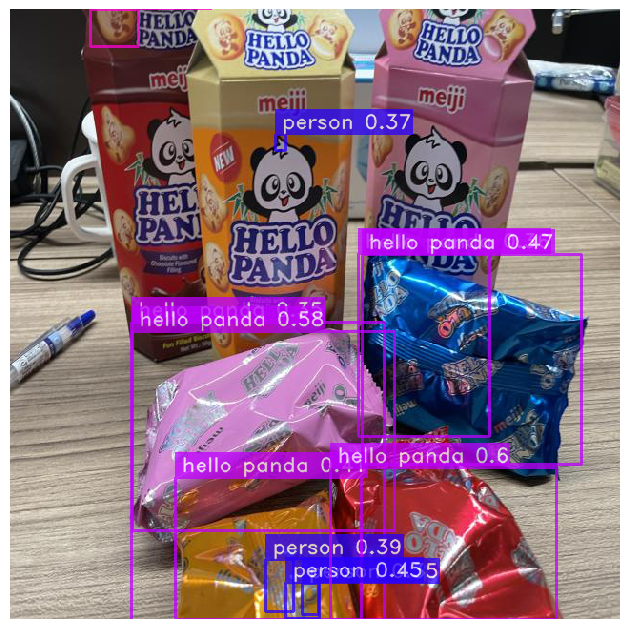

[2023-10-13 17:42:02] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


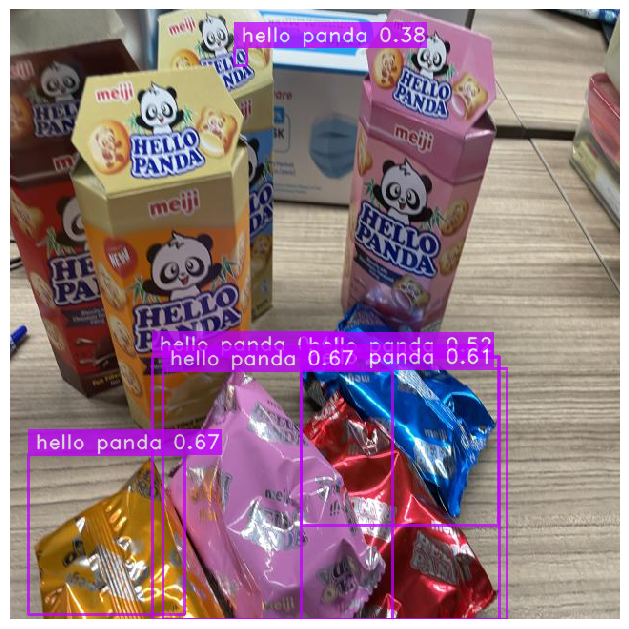

[2023-10-13 17:42:03] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


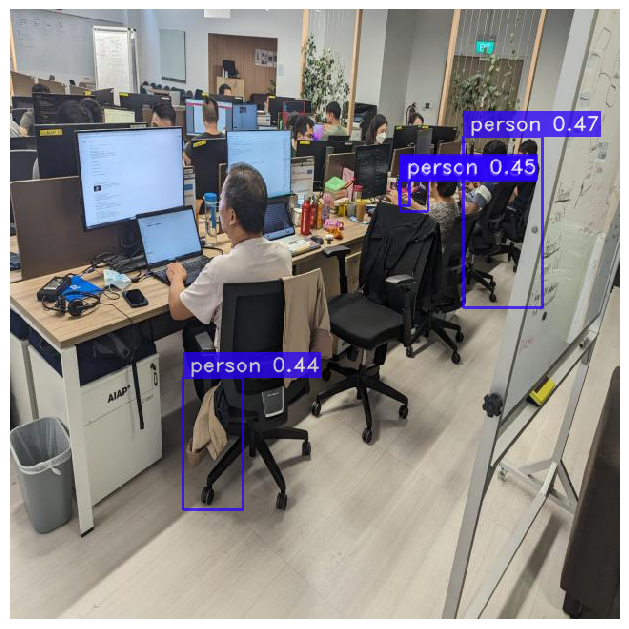

[2023-10-13 17:42:04] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x000001616F366E50>
Traceback (most recent call last):
  File "c:\Users\Yvonne\anaconda3\envs\hellopanda\lib\site-packages\torch\utils\data\dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "c:\Users\Yvonne\anaconda3\envs\hellopanda\lib\site-packages\torch\utils\data\dataloader.py", line 1436, in _shutdown_workers
    if self._persistent_workers or self._workers_status[worker_id]:
AttributeError: '_MultiProcessingDataLoaderIter' object has no attribute '_workers_status'


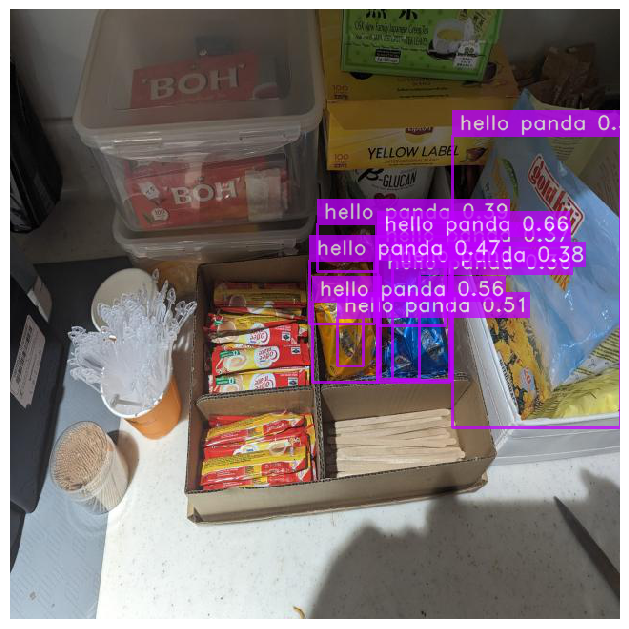

In [90]:
CONFIDENCE_TRESHOLD = 0.35

# imagepath = 'data/valid/images/'
# imagefile = 'IMG_2830_jpg.rf.9f92a5f9adaf5620ea1b490bdaaa848c.jpg'
# image = imagepath + imagefile
#"C:\Users\Yvonne\AIAPAssignments\MiniProj_HelloPanda\data\hp_and_coco128\test\images"

testimagepath = 'data/hp_and_coco128/test/images/'

testimage = testimagepath + 'IMG_2827_jpg.rf.61c0f07d32665f00d7010a155ff9bc0f.jpg'
best_model2.predict(testimage, conf=CONFIDENCE_TRESHOLD).show()

testimage = testimagepath + 'IMG_2830_jpg.rf.171dde021e244a2d6c995fc4d2c8dd73.jpg'
best_model2.predict(testimage, conf=CONFIDENCE_TRESHOLD).show()

testimage = testimagepath + 'IMG_2847_JPG.rf.c2febb45a44bcf20149100a741dc8498.jpg'
best_model2.predict(testimage, conf=CONFIDENCE_TRESHOLD).show()

testimage = testimagepath + 'IMG_2850_JPG.rf.26e4561d7bd39914e214bbae5d21ed2b.jpg'
best_model2.predict(testimage, conf=CONFIDENCE_TRESHOLD).show()

testimage = testimagepath + 'WhatsApp-Image-2023-10-12-at-12-39-49-1-_jpeg.rf.c96696c86d428e4407eb35ab408a1963.jpg'
best_model2.predict(testimage, conf=CONFIDENCE_TRESHOLD).show()

testimage = testimagepath + 'WhatsApp-Image-2023-10-12-at-13-50-12-1-_jpeg.rf.92f53ff52e09b274c2f5aafecaf277ef.jpg'
best_model2.predict(testimage, conf=CONFIDENCE_TRESHOLD).show()